a] generating Dataset 1

In [1]:
# Total number of points
N = 2000

# Each row of X corresponds to a point
X = rand(N, 2)

# Label points
y = zeros(N)
for i = 1:N
    if X[i, 1] >= 0.3 && X[i, 1] <= 0.7 && X[i, 2] >= 0.3 && X[i, 2] <= 0.7
        y[i] = 1  # Point lies inside the rectangle
    else
        y[i] = -1
    end
end

using Random

# Divide the dataset into training set and test set
seq = randperm(N)  # This should now work without any issue
X_training = zeros(Int(N/2), 2)
X_test = zeros(Int(N/2), 2)
y_training = zeros(Int(N/2))
y_test = zeros(Int(N/2))
for i = 1:Int(N/2)
    X_training[i, :] = X[seq[i], :]
    y_training[i] = y[seq[i]]
    X_test[i, :] = X[seq[Int(N/2) + i], :]
    y_test[i] = y[seq[Int(N/2) + i]]
end

In [2]:
using Plots

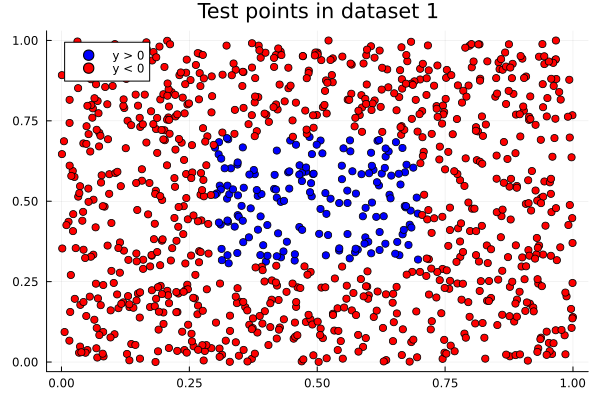

In [3]:
# Plotting the dataset
scatter(X_test[y_test .> 0, 1], X_test[y_test .> 0, 2], color = :blue, label = "y > 0")
scatter!(X_test[y_test .< 0, 1], X_test[y_test .< 0, 2], color = :red, label = "y < 0", title = "Test points in dataset 1")

In [4]:
include("choose_learner.jl")

choose_learner (generic function with 1 method)

In [5]:
include("adaboost.jl")

adaboost (generic function with 1 method)

In [6]:
include("strong_classifier.jl")

strong_classifier (generic function with 1 method)

In [7]:
# Assuming adaboost and strong_classifier functions are defined elsewhere

T = 40

println("****** Adaboost for Dataset 1 *****")

error_training, error_test, i_opt, p_opt, theta_opt, alpha = adaboost(X_training, X_test, T, y_training, y_test)

# Get final classification
H = strong_classifier(X_test, i_opt, p_opt, theta_opt, alpha);


****** Adaboost for Dataset 1 *****
Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.163

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.539

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.008
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.008
Error of the strong classifier on the test set = 0.837

Training error of the strong classifier = 0.167
Error of the strong classifier on the test set = 0.837

Training error of the strong

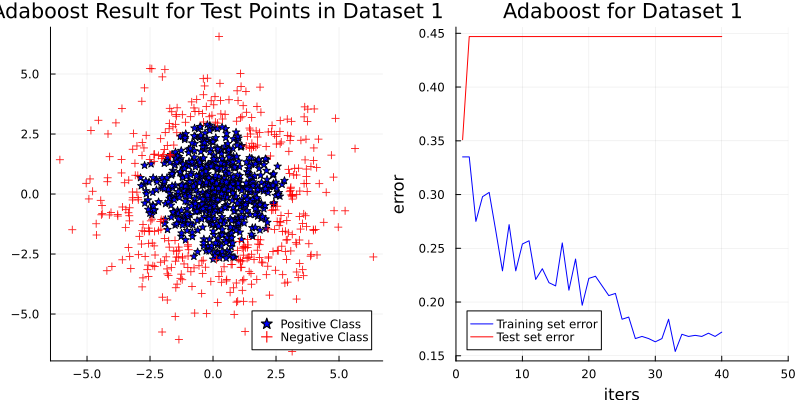

In [22]:
# Adaboost result for test points in dataset 1
pd11 = scatter(X_test[H .> 0, 1], X_test[H .> 0, 2], label="Positive Class"
    , color=:blue, marker=:star
    , title = "Adaboost Result for Test Points in Dataset 1"
)
scatter!(X_test[H .< 0, 1], X_test[H .< 0, 2], label="Negative Class", color=:red, marker=:+)

# Adaboost for Dataset 1
pd12 = plot(error_training
    , label="Training set error"
    , color=:blue
    , xlabel = "iters", ylabel = "error"
    , title = "Adaboost for Dataset 1"
    , xlims = (0,50)
    , legend = :topright
)
plot!(error_test, label="Test set error", color=:red)

plot(pd11, pd12
    , layout=(1, 2)
    , legend=:best
    , size = ( 800, 400 )
)


b] Generating Dataset 2

In [9]:
N = 2000
X = rand(N, 2)

# Label points
y = zeros(N)
for i in 1:N
    if (X[i,1] >= 0.3 && X[i,1] <= 0.7 && X[i,2] >= 0.3 && X[i,2] <= 0.7) ||
       (X[i,1] > 0.15 && X[i,1] < 0.25) || (X[i,1] > 0.75 && X[i,1] < 0.85) ||
       (X[i,2] > 0.15 && X[i,2] < 0.25) || (X[i,2] > 0.75 && X[i,2] < 0.85)
        y[i] = 1
    else
        y[i] = -1
    end
end

seq = randperm(N)
X_training = X[seq[1:Int(N/2)], :]
y_training = y[seq[1:Int(N/2)]]
X_test = X[seq[Int(N/2)+1:end], :]
y_test = y[seq[Int(N/2)+1:end]];

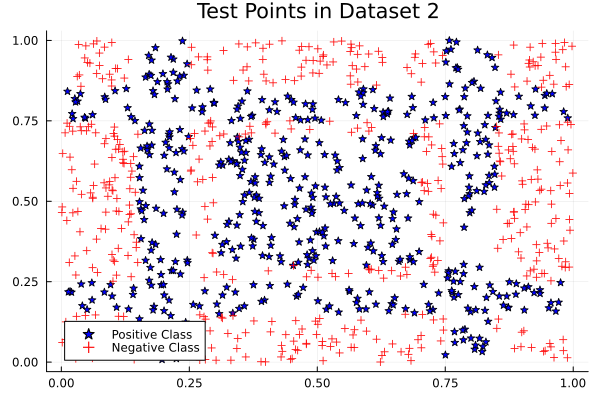

In [10]:
scatter(X_test[y_test .> 0, 1], X_test[y_test .> 0, 2], color=:blue, marker=:star, label="Positive Class")
scatter!(X_test[y_test .< 0, 1], X_test[y_test .< 0, 2], color=:red, marker=:+, label="Negative Class")
title!("Test Points in Dataset 2")

b] Adaboost for Dataset 2

In [11]:
T = 40

println("****** Adaboost for Dataset 2 *****")

# Assuming adaboost and strong_classifier functions are defined
error_training, error_test, i_opt, p_opt, theta_opt, alpha = adaboost(X_training, X_test, T, y_training, y_test)

# Get final classification
H = strong_classifier(X_test, i_opt, p_opt, theta_opt, alpha);

****** Adaboost for Dataset 2 *****
Training error of the strong classifier = 0.374
Error of the strong classifier on the test set = 0.386

Training error of the strong classifier = 0.374
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.383
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.301
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.286
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.276
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.276
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.374
Error of the strong classifier on the test set = 0.485

Training error of the strong classifier = 0.23
Error of the strong classifier on the test set = 0.485

Training error of the strong 

b] Plotting for dataset 2

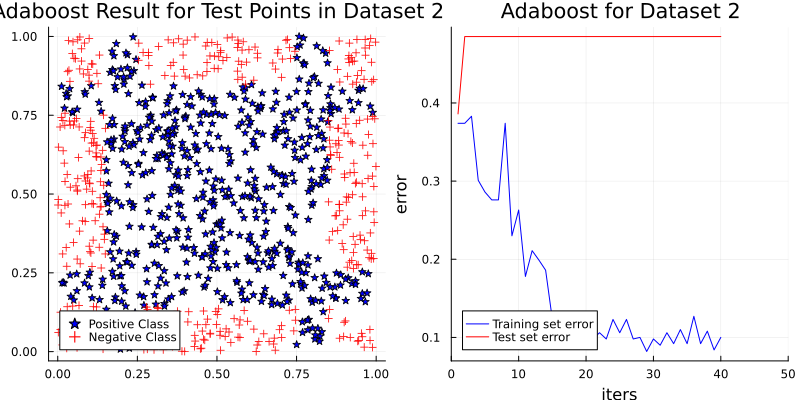

In [12]:
# Adaboost result for test points in dataset 2
pd21 = scatter(X_test[H .> 0, 1], X_test[H .> 0, 2], color=:blue, shape=:star, label="Positive Class")
scatter!(X_test[H .< 0, 1], X_test[H .< 0, 2], color=:red, shape=:+, label="Negative Class")
title!("Adaboost Result for Test Points in Dataset 2")

# Adaboost error plots for dataset 2
pd22 = plot(error_training
    , label="Training set error", color=:blue
    , xlabel = "iters", ylabel = "error"
    , title = "Adaboost for Dataset 2"
    , legend = :bottomright
    , xlims = (0,50)
)
plot!(error_test, label="Test set error", color=:red)

plot(pd21, pd22
    , layout=(1, 2)
    , legend=:best
    , size = ( 800, 400 )
)


In [13]:
N = 2000
X = 2 * randn(N, 2)

dist = sqrt.(sum(X .^ 2, dims=2))

# Label points
y = fill(-1, N)
idx = findall(dist .< 2)
y[idx] .= 1

seq = randperm(N)
X_training = X[seq[1:Int(N/2)], :]
y_training = y[seq[1:Int(N/2)]]
X_test = X[seq[Int(N/2)+1:end], :]
y_test = y[seq[Int(N/2)+1:end]];


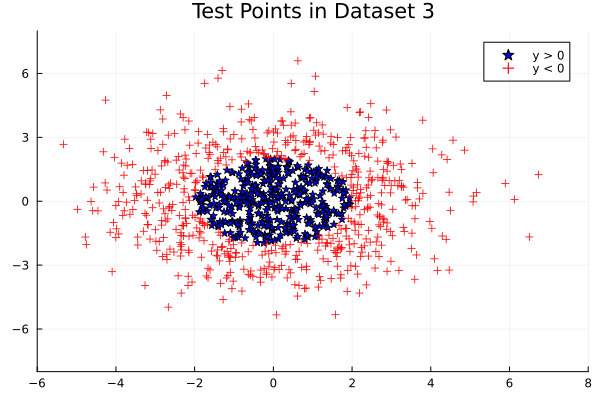

In [14]:
scatter(X_test[y_test .> 0, 1], X_test[y_test .> 0, 2]
    , color=:blue, marker=:star, label="y > 0"
    , title = "Test Points in Dataset 3"
    , xlims = (-6,8), ylims = (-8,8)
)
scatter!(X_test[y_test .< 0, 1], X_test[y_test .< 0, 2]
    , color=:red, marker=:+, label="y < 0"
)

c] Adaboost for Dataset 3

In [15]:
T = 40

println("****** Adaboost for Dataset 3 *****")

# Assuming adaboost and strong_classifier functions are properly defined and available
error_training, error_test, i_opt, p_opt, theta_opt, alpha = adaboost(X_training, X_test, T, y_training, y_test)

# Get final classification
H = strong_classifier(X_test, i_opt, p_opt, theta_opt, alpha);

****** Adaboost for Dataset 3 *****
Training error of the strong classifier = 0.392
Error of the strong classifier on the test set = 0.41

Training error of the strong classifier = 0.424
Error of the strong classifier on the test set = 0.42

Training error of the strong classifier = 0.247
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.392
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.168
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.304
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.099
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.073
Error of the strong classifier on the test set = 0.591

Training error of the strong classifier = 0.099
Error of the strong classifier on the test set = 0.591

Training error of the strong c

c] Plotting for dataset 3

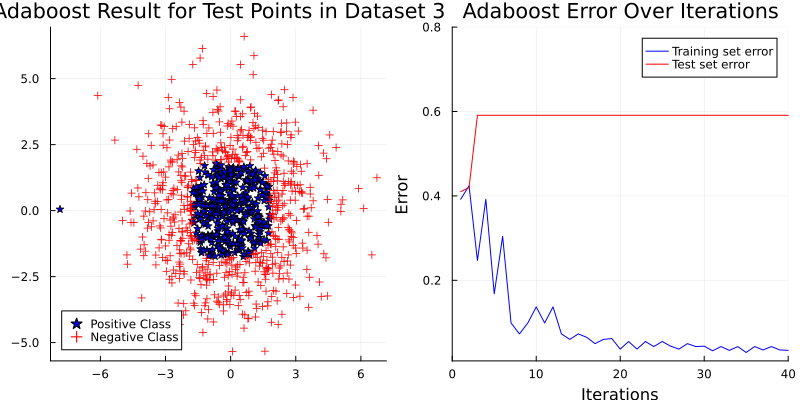

In [16]:
p1 = scatter(X_test[H .> 0, 1], X_test[H .> 0, 2], color=:blue, marker=:star, label="Positive Class")
scatter!(X_test[H .< 0, 1], X_test[H .< 0, 2], color=:red, marker=:+, label="Negative Class")
title!("Adaboost Result for Test Points in Dataset 3")

p2 = plot(error_training
    , label="Training set error", color=:blue
    , xlabel = "Iterations", ylabel = "Error"
    , title = "Adaboost Error Over Iterations"
    , xlims = (0,40), ylims = (0.009,0.8)
)
plot!(error_test
    , label="Test set error", color=:red
)

plot(p1, p2
    , layout=(1, 2)
    , legend=:best
    , size = ( 800, 400 )
)


d] Generating Dataset 4

In [17]:
N = 2000
X = 2 * randn(N, 2)

# Calculate distances from the origin
dist = sqrt.(sum(X .^ 2, dims=2))

# Label points based on distance
y = fill(-1, N)
idx = (dist .< 2) .| ((dist .> 2.5) .& (dist .< 3))
y[idx,:] .= 1

# Divide the dataset into training set and test set
seq = randperm(N)
X_training = X[seq[1:Int(N/2)], :]
y_training = y[seq[1:Int(N/2)]]
X_test = X[seq[Int(N/2)+1:end], :]
y_test = y[seq[Int(N/2)+1:end]];

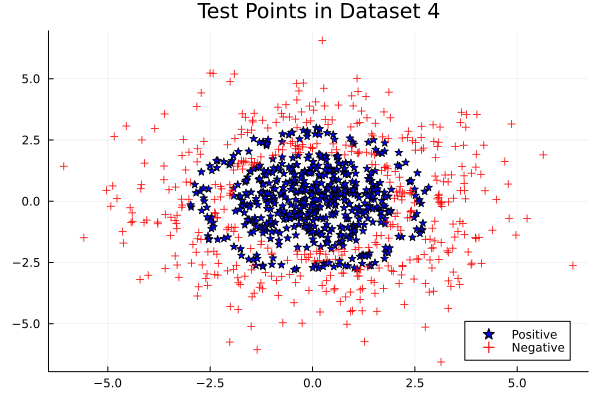

In [18]:
# Plotting the dataset for Dataset 4
scatter(X_test[y_test .> 0, 1], X_test[y_test .> 0, 2], color=:blue, shape=:star, label="Positive")
scatter!(X_test[y_test .< 0, 1], X_test[y_test .< 0, 2], color=:red, shape=:+, label="Negative")
title!("Test Points in Dataset 4")

d] Adaboost for Dataset 4

In [19]:
T = 40

println("****** Adaboost for Dataset 4 *****")

# Execute AdaBoost algorithm
error_training, error_test, i_opt, p_opt, theta_opt, alpha = adaboost(X_training, X_test, T, y_training, y_test)

# Get final classification from the strong classifier
H = strong_classifier(X_test, i_opt, p_opt, theta_opt, alpha);


****** Adaboost for Dataset 4 *****
Training error of the strong classifier = 0.335
Error of the strong classifier on the test set = 0.351

Training error of the strong classifier = 0.335
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.275
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.298
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.302
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.266
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.229
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.272
Error of the strong classifier on the test set = 0.447

Training error of the strong classifier = 0.229
Error of the strong classifier on the test set = 0.447

Training error of the strong

d] Plotting for dataset 4

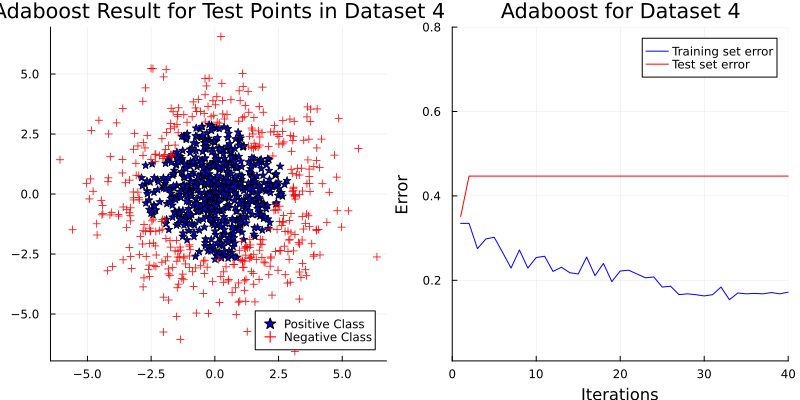

In [20]:
# Adaboost result for test points in dataset 4
pd41 = scatter(X_test[H .> 0, 1], X_test[H .> 0, 2], color=:blue, marker=:star, label="Positive Class")
scatter!(X_test[H .< 0, 1], X_test[H .< 0, 2], color=:red, marker=:+, label="Negative Class")
title!("Adaboost Result for Test Points in Dataset 4")

# Adaboost errors over iterations for dataset 4
pd42 = plot(error_training, label="Training set error", color=:blue
        , xlims = (0,40), ylims = (0.009,0.8)

)
plot!(error_test, label="Test set error", color=:red, legend=:topright)
xlabel!("Iterations")
ylabel!("Error")
title!("Adaboost for Dataset 4")

plot(pd41,pd42
    , size = (800,400)
)